# Dataset

- Dataset: https://www.kaggle.com/snapcrack/all-the-news

## Articles1.csv

- Liberal: Atlantic
- Conservative: Breitbart
- Neutral: CNN, New York Times

**Number of Articles**

* Atlantic: 171
* CNN: 11488
* New York Times: 7803
* Breitbart: 23781

## Articles2.csv

- Liberal: Atlantic, Buzzfeed News
- Conservative: New York Post, National Review, Fox News
- Neutral: Guardian

**Number of Articles**

* Atlantic: 7008
* Buzzfeed News: 4854
* Guardian: 4873
* New York Post: 17493
* National Review: 6203
* Fox News: 4354

## Articles3.csv

- Liberal: Vox
- Conservative: NONE
- Neutral: Guardian, Reuters, NPR, Washington Post

**Number of Articles**

* Vox: 4947
* Guardian: 3808
* Reuters: 10710
* Washington Post: 11114
* NPR: 11992

# Pre-Processing Output
- **Seperate liberal/conservative articles**: conserv.csv, liberal.csv, neutral.csv
> seperate("articles1.csv") save("liberal.csv",lib)
- **After balancing**: conserv16000.csv, liberal16000.csv
- **Get Korean articles**: korean.csv
> korean("articles1.csv","articles2.csv","articles1.cs3","korean")
- **Text Operation**: new_conserv.txt, new_liberal.txt
> textoperation("conserv16000.csv","new_conserv")

korean articles can seperated later if we need

# Seperate Liberal, Concervative articles

## Media Bias Chart

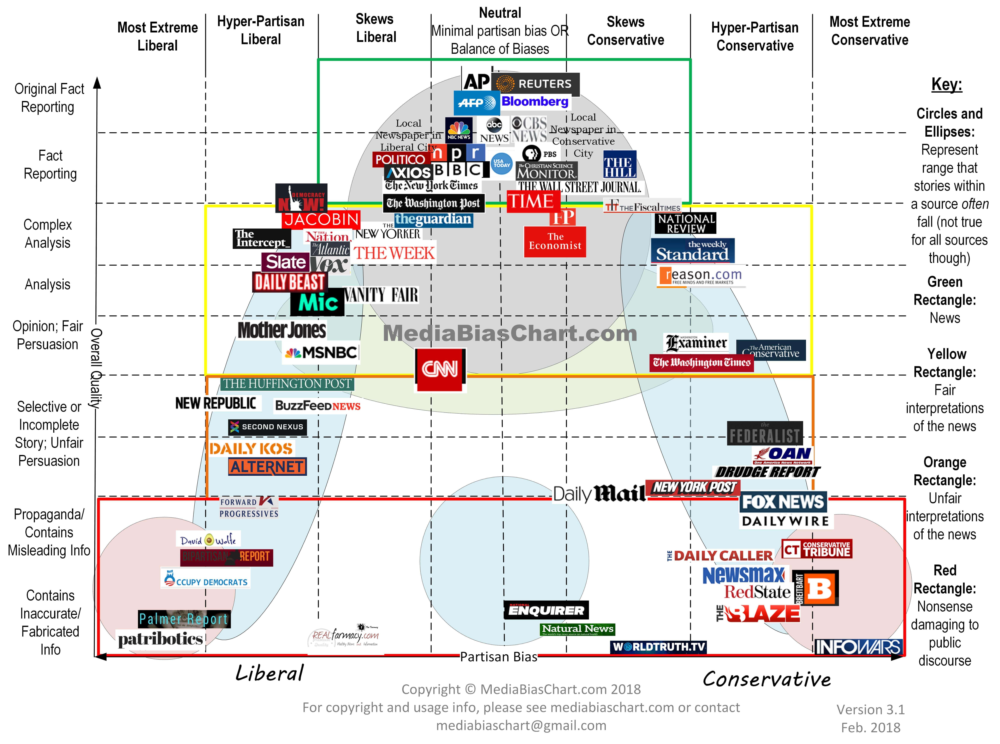

In [1]:
from IPython.display import Image
Image("mediabias.png")

Seperate articles by publication with this chart.

In [2]:
liba = ['Atlantic','Buzzfeed News','Vox']
cona = ['Breitbart','New York Post','National Review','Fox News']
neua = ['CNN','New York Times','Guardian','Reuters','NPR','Washington Post']


lib=[]
con=[]
neu=[]

def seperate(openfilename):
    a_list = []

    read(openfilename,a_list)
    
    for i in range(len(a_list)):
        for j in range(len(liba)):
            if a_list[i][3]==liba[j]:
                lib.append(a_list[i])
        for j in range(len(cona)):
            if a_list[i][3]==cona[j]:
                con.append(a_list[i])        
        for j in range(len(neua)):
            if a_list[i][3]==neua[j]:
                neu.append(a_list[i])

def read(filename,x):
    f = open(filename,'r',encoding='utf-8')
    reader = csv.reader(f)
    for row in reader:
        x.append(row)
    f.close()
    
def save(filename,x):
    csvfile = open(filename,"w", newline="",encoding='utf-8')
    csvwriter = csv.writer(csvfile)
    for row in x:
        csvwriter.writerow(row)
    csvfile.close()
    

Run example,

In [ ]:
seperate("articles1.csv")
seperate("articles2.csv")
seperate("articles3.csv")
save("liberal.csv",lib)
save("conserv.csv",con)
save("neutral.csv",neu)

# Text Operation

In [14]:
import string
import csv
import nltk
import numpy as np
import re
from nltk import word_tokenize, tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer


csv.field_size_limit(100000000)
p = re.compile('[a-z0-9]+')
stopWords = set(stopwords.words('english'))
new_stopWords = ["miloyiannopoulo","yiannopol","fuckmilo","http","miloyiannopoulos","milo","yiannopoulos","email","like", "say", "said", "de", "le", "one","also", "hou", "say","like","get", "would", "mani", "show","make", "even", "facebook", "twitter", "think", "follow", "mdr", "year", "uber", "u", "a", "deemed", "go", "breitbart"]

############## If anyone find new stopwords, add in this list ###############


In [15]:
def textoperation(openfilename, savefilename):
    data = [] # loaded from csv file
    valid = []  # valid word
    editor = [] # chunk of editor
    tk_editor = [] # token_editor
    public = [] # chunk of publication
    tk_public = [] # token_publication
    
    read(openfilename,data)
    
    for i in range(len(data)):
        valid.append(data[i][9])  # valid data in dataset, index = 9
    for i in range(len(data)):
        editor.append(data[i][4]) # valid data in datast, index = 4 editor's name
    for i in range(len(data)):
        public.append(data[i][3]) # valid data in datast, index = 3 publication's name
    
    fn = []
    real = []

    # Split editor, publication info from .csv file
    for i in range(len(valid)):
        tk_editor.append(editor[i].split(" "))
        tk_public.append(editor[i].split(" "))

        fn.append(valid[i].split(" "))
    
    # Remove editor, publication information in articles text
    for i in range(len(fn)):
        real.append([])
        for j in range(len(fn[i])):
            if "@" not in fn[i][j]:
                for k in range(len(tk_editor[i])):
                    if tk_editor[i][k] in fn[i][j]:
                        #print("1"+tk_editor[i][k]+","+fn[i][j])
                        break
                    else:
                        if k==(len(tk_editor[i])-1):
                            for m in range(len(tk_public[i])):
                                if tk_public[i][m] in fn[i][j]:
                                    break
                                else:
                                    if m==(len(tk_public[i])-1):
                            #print("2"+tk_editor[i][k]+","+fn[i][j])
                                        real[i].append(fn[i][j])
    
    finish = ["" for x in range(len(valid))]

    for i in range(len(real)):
        filtered = []
        re_filtered = []
        w_list = []
        ps = PorterStemmer()
        
        # Put everything to lower case
        lowerContents = str(real[i]).lower()
        
        # Get rid of punctuation & tokenize
        punc = lowerContents.translate(str.maketrans('', '', string.punctuation))
        tokens = word_tokenize(punc)
        
        
        # Get rid of stopwords & quotes 
        for w in tokens:
            if w not in stopWords:
                m = p.match(w) # [a-z0-9]+
                if m != None:
                    filtered.append(w)
        for j in range(len(filtered)):
            for k in range(len(new_stopWords)):
                if filtered[j]==new_stopWords[k]:
                    #print(filtered[j]+" same "+new_stopWords[k]) # for test
                    break
                else:
                    if k == (len(new_stopWords)-1):
                        re_filtered.append(filtered[j])

        # Do stemming
        for w in re_filtered:
            words = tokenize.word_tokenize(w)
            for w in words:
                w_list.append(ps.stem(w))
                
        # Remove hidden stopWords
        final_filtered = []
        for j in range(len(w_list)):
            for k in range(len(new_stopWords)):
                if w_list[j]==new_stopWords[k]:
                    #print(w_list[j]+" same "+new_stopWords[k])
                    break
                else:
                    if k == (len(new_stopWords)-1):
                        final_filtered.append(w_list[j])
                        
        # Join all valuable result made from one article
        finish[i] = " ".join(final_filtered)

    # save - txt format(only valid data)
    txtformat = open(savefilename + ".txt", "w", encoding="UTF8")
    for i in range(len(finish)):
        print(i)
        txtformat.write(str(finish[i]) + "\n")

Run example,

In [17]:
textoperation("liberal16000.csv","new_liberal")

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

2563
2564
2565
2566
2567
2568
2569
2570
2571
2572
2573
2574
2575
2576
2577
2578
2579
2580
2581
2582
2583
2584
2585
2586
2587
2588
2589
2590
2591
2592
2593
2594
2595
2596
2597
2598
2599
2600
2601
2602
2603
2604
2605
2606
2607
2608
2609
2610
2611
2612
2613
2614
2615
2616
2617
2618
2619
2620
2621
2622
2623
2624
2625
2626
2627
2628
2629
2630
2631
2632
2633
2634
2635
2636
2637
2638
2639
2640
2641
2642
2643
2644
2645
2646
2647
2648
2649
2650
2651
2652
2653
2654
2655
2656
2657
2658
2659
2660
2661
2662
2663
2664
2665
2666
2667
2668
2669
2670
2671
2672
2673
2674
2675
2676
2677
2678
2679
2680
2681
2682
2683
2684
2685
2686
2687
2688
2689
2690
2691
2692
2693
2694
2695
2696
2697
2698
2699
2700
2701
2702
2703
2704
2705
2706
2707
2708
2709
2710
2711
2712
2713
2714
2715
2716
2717
2718
2719
2720
2721
2722
2723
2724
2725
2726
2727
2728
2729
2730
2731
2732
2733
2734
2735
2736
2737
2738
2739
2740
2741
2742
2743
2744
2745
2746
2747
2748
2749
2750
2751
2752
2753
2754
2755
2756
2757
2758
2759
2760
2761
2762


4297
4298
4299
4300
4301
4302
4303
4304
4305
4306
4307
4308
4309
4310
4311
4312
4313
4314
4315
4316
4317
4318
4319
4320
4321
4322
4323
4324
4325
4326
4327
4328
4329
4330
4331
4332
4333
4334
4335
4336
4337
4338
4339
4340
4341
4342
4343
4344
4345
4346
4347
4348
4349
4350
4351
4352
4353
4354
4355
4356
4357
4358
4359
4360
4361
4362
4363
4364
4365
4366
4367
4368
4369
4370
4371
4372
4373
4374
4375
4376
4377
4378
4379
4380
4381
4382
4383
4384
4385
4386
4387
4388
4389
4390
4391
4392
4393
4394
4395
4396
4397
4398
4399
4400
4401
4402
4403
4404
4405
4406
4407
4408
4409
4410
4411
4412
4413
4414
4415
4416
4417
4418
4419
4420
4421
4422
4423
4424
4425
4426
4427
4428
4429
4430
4431
4432
4433
4434
4435
4436
4437
4438
4439
4440
4441
4442
4443
4444
4445
4446
4447
4448
4449
4450
4451
4452
4453
4454
4455
4456
4457
4458
4459
4460
4461
4462
4463
4464
4465
4466
4467
4468
4469
4470
4471
4472
4473
4474
4475
4476
4477
4478
4479
4480
4481
4482
4483
4484
4485
4486
4487
4488
4489
4490
4491
4492
4493
4494
4495
4496


6365
6366
6367
6368
6369
6370
6371
6372
6373
6374
6375
6376
6377
6378
6379
6380
6381
6382
6383
6384
6385
6386
6387
6388
6389
6390
6391
6392
6393
6394
6395
6396
6397
6398
6399
6400
6401
6402
6403
6404
6405
6406
6407
6408
6409
6410
6411
6412
6413
6414
6415
6416
6417
6418
6419
6420
6421
6422
6423
6424
6425
6426
6427
6428
6429
6430
6431
6432
6433
6434
6435
6436
6437
6438
6439
6440
6441
6442
6443
6444
6445
6446
6447
6448
6449
6450
6451
6452
6453
6454
6455
6456
6457
6458
6459
6460
6461
6462
6463
6464
6465
6466
6467
6468
6469
6470
6471
6472
6473
6474
6475
6476
6477
6478
6479
6480
6481
6482
6483
6484
6485
6486
6487
6488
6489
6490
6491
6492
6493
6494
6495
6496
6497
6498
6499
6500
6501
6502
6503
6504
6505
6506
6507
6508
6509
6510
6511
6512
6513
6514
6515
6516
6517
6518
6519
6520
6521
6522
6523
6524
6525
6526
6527
6528
6529
6530
6531
6532
6533
6534
6535
6536
6537
6538
6539
6540
6541
6542
6543
6544
6545
6546
6547
6548
6549
6550
6551
6552
6553
6554
6555
6556
6557
6558
6559
6560
6561
6562
6563
6564


8294
8295
8296
8297
8298
8299
8300
8301
8302
8303
8304
8305
8306
8307
8308
8309
8310
8311
8312
8313
8314
8315
8316
8317
8318
8319
8320
8321
8322
8323
8324
8325
8326
8327
8328
8329
8330
8331
8332
8333
8334
8335
8336
8337
8338
8339
8340
8341
8342
8343
8344
8345
8346
8347
8348
8349
8350
8351
8352
8353
8354
8355
8356
8357
8358
8359
8360
8361
8362
8363
8364
8365
8366
8367
8368
8369
8370
8371
8372
8373
8374
8375
8376
8377
8378
8379
8380
8381
8382
8383
8384
8385
8386
8387
8388
8389
8390
8391
8392
8393
8394
8395
8396
8397
8398
8399
8400
8401
8402
8403
8404
8405
8406
8407
8408
8409
8410
8411
8412
8413
8414
8415
8416
8417
8418
8419
8420
8421
8422
8423
8424
8425
8426
8427
8428
8429
8430
8431
8432
8433
8434
8435
8436
8437
8438
8439
8440
8441
8442
8443
8444
8445
8446
8447
8448
8449
8450
8451
8452
8453
8454
8455
8456
8457
8458
8459
8460
8461
8462
8463
8464
8465
8466
8467
8468
8469
8470
8471
8472
8473
8474
8475
8476
8477
8478
8479
8480
8481
8482
8483
8484
8485
8486
8487
8488
8489
8490
8491
8492
8493


10792
10793
10794
10795
10796
10797
10798
10799
10800
10801
10802
10803
10804
10805
10806
10807
10808
10809
10810
10811
10812
10813
10814
10815
10816
10817
10818
10819
10820
10821
10822
10823
10824
10825
10826
10827
10828
10829
10830
10831
10832
10833
10834
10835
10836
10837
10838
10839
10840
10841
10842
10843
10844
10845
10846
10847
10848
10849
10850
10851
10852
10853
10854
10855
10856
10857
10858
10859
10860
10861
10862
10863
10864
10865
10866
10867
10868
10869
10870
10871
10872
10873
10874
10875
10876
10877
10878
10879
10880
10881
10882
10883
10884
10885
10886
10887
10888
10889
10890
10891
10892
10893
10894
10895
10896
10897
10898
10899
10900
10901
10902
10903
10904
10905
10906
10907
10908
10909
10910
10911
10912
10913
10914
10915
10916
10917
10918
10919
10920
10921
10922
10923
10924
10925
10926
10927
10928
10929
10930
10931
10932
10933
10934
10935
10936
10937
10938
10939
10940
10941
10942
10943
10944
10945
10946
10947
10948
10949
10950
10951
10952
10953
10954
10955
10956
10957
1095

12595
12596
12597
12598
12599
12600
12601
12602
12603
12604
12605
12606
12607
12608
12609
12610
12611
12612
12613
12614
12615
12616
12617
12618
12619
12620
12621
12622
12623
12624
12625
12626
12627
12628
12629
12630
12631
12632
12633
12634
12635
12636
12637
12638
12639
12640
12641
12642
12643
12644
12645
12646
12647
12648
12649
12650
12651
12652
12653
12654
12655
12656
12657
12658
12659
12660
12661
12662
12663
12664
12665
12666
12667
12668
12669
12670
12671
12672
12673
12674
12675
12676
12677
12678
12679
12680
12681
12682
12683
12684
12685
12686
12687
12688
12689
12690
12691
12692
12693
12694
12695
12696
12697
12698
12699
12700
12701
12702
12703
12704
12705
12706
12707
12708
12709
12710
12711
12712
12713
12714
12715
12716
12717
12718
12719
12720
12721
12722
12723
12724
12725
12726
12727
12728
12729
12730
12731
12732
12733
12734
12735
12736
12737
12738
12739
12740
12741
12742
12743
12744
12745
12746
12747
12748
12749
12750
12751
12752
12753
12754
12755
12756
12757
12758
12759
12760
1276

14289
14290
14291
14292
14293
14294
14295
14296
14297
14298
14299
14300
14301
14302
14303
14304
14305
14306
14307
14308
14309
14310
14311
14312
14313
14314
14315
14316
14317
14318
14319
14320
14321
14322
14323
14324
14325
14326
14327
14328
14329
14330
14331
14332
14333
14334
14335
14336
14337
14338
14339
14340
14341
14342
14343
14344
14345
14346
14347
14348
14349
14350
14351
14352
14353
14354
14355
14356
14357
14358
14359
14360
14361
14362
14363
14364
14365
14366
14367
14368
14369
14370
14371
14372
14373
14374
14375
14376
14377
14378
14379
14380
14381
14382
14383
14384
14385
14386
14387
14388
14389
14390
14391
14392
14393
14394
14395
14396
14397
14398
14399
14400
14401
14402
14403
14404
14405
14406
14407
14408
14409
14410
14411
14412
14413
14414
14415
14416
14417
14418
14419
14420
14421
14422
14423
14424
14425
14426
14427
14428
14429
14430
14431
14432
14433
14434
14435
14436
14437
14438
14439
14440
14441
14442
14443
14444
14445
14446
14447
14448
14449
14450
14451
14452
14453
14454
1445

15788
15789
15790
15791
15792
15793
15794
15795
15796
15797
15798
15799
15800
15801
15802
15803
15804
15805
15806
15807
15808
15809
15810
15811
15812
15813
15814
15815
15816
15817
15818
15819
15820
15821
15822
15823
15824
15825
15826
15827
15828
15829
15830
15831
15832
15833
15834
15835
15836
15837
15838
15839
15840
15841
15842
15843
15844
15845
15846
15847
15848
15849
15850
15851
15852
15853
15854
15855
15856
15857
15858
15859
15860
15861
15862
15863
15864
15865
15866
15867
15868
15869
15870
15871
15872
15873
15874
15875
15876
15877
15878
15879
15880
15881
15882
15883
15884
15885
15886
15887
15888
15889
15890
15891
15892
15893
15894
15895
15896
15897
15898
15899
15900
15901
15902
15903
15904
15905
15906
15907
15908
15909
15910
15911
15912
15913
15914
15915
15916
15917
15918
15919
15920
15921
15922
15923
15924
15925
15926
15927
15928
15929
15930
15931
15932
15933
15934
15935
15936
15937
15938
15939
15940
15941
15942
15943
15944
15945
15946
15947
15948
15949
15950
15951
15952
15953
1595

# Get Korean articles

In [9]:
k_art=[]

def korean(file1, file2, file3, savefilename): 
    k_list = []

    read(file1, k_list)
    read(file2, k_list)
    read(file3, k_list)
    for i in range(len(k_list)):
        if 'Korean' in k_list[i][9]:
            k_art.append(k_list[i])
        elif 'Korea' in k_list[i][9]:
            k_art.append(k_list[i])
        elif 'korean' in k_list[i][9]:
            k_art.append(k_list[i])
        elif 'korean' in k_list[i][9]:
            k_art.append(k_list[i])


    csvfile = open(savefilename + ".csv", "w", newline="", encoding='UTF8')
    csvwriter = csv.writer(csvfile)
    for row in k_art:
        csvwriter.writerow(row)
    csvfile.close()

Run example,

In [10]:
korean("articles1.csv","articles2.csv","articles3.csv","korean") # make "korean.csv" file from original dataset.

In [11]:
textoperation("korean.csv","new_korean")